# Healthy Corner Stores in Washington DC
### This data explores the distribution of healthy corner stores across different census tracts in Washington DC. These stores currently participate in DC Central Kitchen's (DCCK) Healthy Corners program selling fresh, healthy produce options.
### Produced by Emily Biro 

I first imported pandas and geopandas to being data exploration

In [92]:
import pandas as pd
import geopandas as gpd

## Data Exploration
Let's import the data file with the healthy corner stores locations in DC

In [93]:
healthy = pd.read_csv('Healthy_Corner_Stores.csv')

Now, I will begin data exploration to get familiar with what is included in this data file

Lets check out the shape of the data

In [94]:
healthy.shape

(71, 17)

71 rows and 17 columns!
Let's check out the first 5 rows of this data

In [95]:
healthy.head()

,X,Y,OBJECTID,STORE,ADDRESS,XCOORD,YCOORD,MATCHTYPE,MAR_ID,LATITUDE,LONGITUDE,GIS_ID,GLOBALID,CREATOR,CREATED,EDITOR,EDITED
0,-77.019079,38.975046,1,BP Blaire Gas Station,7000 Blair Rd NW,398346.95,145235.41,Exact,249127.0,38.975039,-77.019077,HealthyCornerStorePt_1,{F6CD05AE-1648-404D-B7A3-603BE5E3361B},NaN,NaN,NaN,NaN
1,-77.028431,38.961525,2,Missouri Avenue Market,5900 Georgia Ave NW,397536.12,143734.68,Exact,253189.0,38.961518,-77.028429,HealthyCornerStorePt_2,{87C1AAA2-139C-4A8D-AA34-DF7A3AA1312C},NaN,NaN,NaN,NaN
2,-77.010355,38.956438,3,Capital View Convenience Store,12 Kennedy St NW,399102.65,143169.61,Exact,283923.0,38.956431,-77.010353,HealthyCornerStorePt_3,{77D178A5-1D12-492B-A96C-5D0FFC242C97},NaN,NaN,NaN,NaN
3,-77.027749,38.955825,4,S&G Liquor and Grocery,5421 Georgia Ave NW,397595.00,143101.81,Exact,254615.0,38.955817,-77.027747,HealthyCornerStorePt_4,{D8EB793F-418B-43A8-843B-DA0CFACA0832},NaN,NaN,NaN,NaN
4,-77.020196,38.955826,5,Starlight Food,5424 5th St NW,0.00,0.00,Manual,NaN,NaN,NaN,HealthyCornerStorePt_5,{1DA97531-D58F-4F82-9D9B-4071D1B7B361},NaN,NaN,NaN,NaN


In [96]:
healthy.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   X          71 non-null     float64
 1   Y          71 non-null     float64
 2   OBJECTID   71 non-null     int64  
 3   STORE      71 non-null     object 
 4   ADDRESS    71 non-null     object 
 5   XCOORD     71 non-null     float64
 6   YCOORD     71 non-null     float64
 7   MATCHTYPE  71 non-null     object 
 8   MAR_ID     68 non-null     float64
 9   LATITUDE   68 non-null     float64
 10  LONGITUDE  68 non-null     float64
 11  GIS_ID     71 non-null     object 
 12  GLOBALID   71 non-null     object 
 13  CREATOR    0 non-null      float64
 14  CREATED    0 non-null      float64
 15  EDITOR     0 non-null      float64
 16  EDITED     0 non-null      float64
dtypes: float64(11), int64(1), object(5)
memory usage: 9.6+ KB


Hm, looks like there is no FIPS data, so we will instead use folium to plot the points on top of the census tracts.

Though first, let's clean up the data. 

In [97]:
desired_columns = ['STORE','ADDRESS','LATITUDE','LONGITUDE']

Let's take a look at our trimmed data and save so we can use it! 

In [98]:
healthy[desired_columns].sample(5)

,STORE,ADDRESS,LATITUDE,LONGITUDE
45,The Corner Market,400 East Capitol St NE,38.890067,-77.000374
25,McKinley Market,321 T Street NE,38.915302,-77.000995
70,Elmira Grocery,4401 South Capitol Street SW,38.825888,-77.007551
13,Sonya’s Market,2833 11th St NW,38.926653,-77.026799
64,Liff’s Market,600 Alabama Ave SE,38.843387,-76.997583


In [107]:
healthy_trimmed = healthy[desired_columns].copy()

In [108]:
healthy_trimmed = healthy_trimmed.dropna()


## Maps

Let's take a look at this data in a map format, zoomed into DC

In [128]:
import folium

In [129]:
m = folium.Map(location=[38.9072, -77.0369])
m

Now that we have our base map, lets add census tracts as a layer to view the store locations

In [130]:

tracts=gpd.read_file('Census_Tracts_in_2020.geojson')
tracts.head()

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,P0050004,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,0,0,31,0,0,31,0,0,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."
2,3,002102,11001002102,5099,4599,901,2910,50,87,0,...,0,0,0,145,0,0,145,0,0,"POLYGON ((-77.01997 38.95819, -77.01997 38.958..."
3,4,002201,11001002201,3485,3138,973,1722,21,94,2,...,6,0,0,0,0,0,0,0,0,"POLYGON ((-77.02743 38.95188, -77.02740 38.951..."
4,5,002202,11001002202,3339,2957,619,1636,48,57,3,...,0,0,0,4,0,0,4,0,0,"POLYGON ((-77.01968 38.95209, -77.01963 38.951..."


Now let's add some markers for the store locations so we can add that to the map

In [132]:
for index, row in healthy_trimmed.iterrows():
    print(row.STORE, row.LATITUDE, row.LONGITUDE)

BP Blaire Gas Station 38.97503886 -77.01907675
Missouri Avenue Market 38.96151802 -77.0284286
Capital View Convenience Store 38.95643072 -77.01035301
S&G Liquor and Grocery 38.95581712 -77.02774702
Milestone Place 38.95003472 -77.00719103
Kwik Stop 38.94841952 -77.02664291
Newton Market 38.93369574 -76.99123628
7 Days Market 38.93040448 -77.02318685
Dollar Plus Food Store (Bladensburg Rd.) 38.92981797 -76.95991355
Good Food Markets 38.9295256 -76.97578942
Market 77 38.92882898 -77.02292985
Stop And Go 38.92796519 -77.02583213
Sonya’s Market 38.92665256 -77.02679888
Neighborhood Market 38.9262256 -76.98126499
Bodega Market (Franklin St) 38.9253538 -76.97157924
Quick Trip 38.92505753 -76.98604287
Uptown Market 38.92502379 -77.03205305
Midtown Market 38.92260905 -76.99271556
Capitol Market 38.92252463 -77.0087296
Sunbeam Market 38.92114811 -77.0093752
Crown Gas Station Florida Ave 38.91780411 -77.02443549
New Reservoir Market 38.91685797 -77.01241545
Shell New York Avenue 38.91662954 -76.

In [134]:
for index, row in healthy_trimmed.iterrows():
    folium.Marker([row.LATITUDE, row.LONGITUDE], popup=row.STORE, tooltip=row.STORE).add_to(m)
m

Great! Now let's add the census tract data as a layer to the folium map

In [135]:
folium.GeoJson(tracts, name="geojson").add_to(m)
folium.LayerControl().add_to(m)

In [136]:
m

Now we are able to see where the healthy store locations are within each census tract in DC

Using the data we worked with last week to explore income data in DC, I am interested to see where healthy corner store locations are relative to low-income populations. So first, let's add in our income data

In [137]:
df = pd.read_csv('R13283344_SL140.csv')

In [138]:
df = pd.read_csv(
    'R13283344_SL140.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

Cleaning up the data to get rid of any empty cells

In [139]:
df = df.dropna(axis=1,how="all")

In [140]:
columns_to_keep = ['Geo_FIPS',
                   'SE_A14001_001',
                   'SE_A14001_002',
                   'SE_A14001_003',
                   'SE_A14001_004',
                   'SE_A14001_005',
                   'SE_A14001_006',
                   'SE_A14001_007',
                   'SE_A14001_008',
                   'SE_A14001_009',
                   'SE_A14001_010',
                   'SE_A14001_011',
                   'SE_A14001_012',
                   'SE_A14001_013',
                   'SE_A14001_014',
                   'SE_A14001_015',
                   'SE_A14001_016',
                   'SE_A14001_017']

df2 = df[columns_to_keep]

In [141]:

columns = list(df2) 
columns

['Geo_FIPS',
 'SE_A14001_001',
 'SE_A14001_002',
 'SE_A14001_003',
 'SE_A14001_004',
 'SE_A14001_005',
 'SE_A14001_006',
 'SE_A14001_007',
 'SE_A14001_008',
 'SE_A14001_009',
 'SE_A14001_010',
 'SE_A14001_011',
 'SE_A14001_012',
 'SE_A14001_013',
 'SE_A14001_014',
 'SE_A14001_015',
 'SE_A14001_016',
 'SE_A14001_017']

In [142]:
df2.columns = ['FIPS',
'Number of Households',
'Less than $10,000',
'$10,000 to $14,999',
'$15,000 to $19,999',
'$20,000 to $24,999',
'$25,000 to $29,999',
'$30,000 to $34,999',
'$35,000 to $39,999',
'$40,000 to $44,999',
'$45,000 to $49,999',
'$50,000 to $59,999',
'$60,000 to $74,999',
'$75,000 to $99,999',
'$100,000 to $124,999',
'$125,000 to $149,999',
'$150,000 to $199,999',
'$200,000 or More']


Now that the income data is cleaned up, we can merge with our census tract data in order to map

In [143]:
tracts['FIPS'] ='11' + '001' + tracts['TRACT']

In [144]:
tracts_income=tracts.merge(df2,on="FIPS")

As I mentioned earlier, we are most interested in identifying low-income areas and plotting the store locations 

In [145]:
tracts_income['PCT_Under $10,000'] = tracts_income['Less than $10,000']/tracts_income['Number of Households']*100
tracts_income['PCT_Over $200,000'] = tracts_income['$200,000 or More']/tracts_income['Number of Households']*100

To get started, let's map the areas with percentage of incomes under $10,000

<AxesSubplot: >

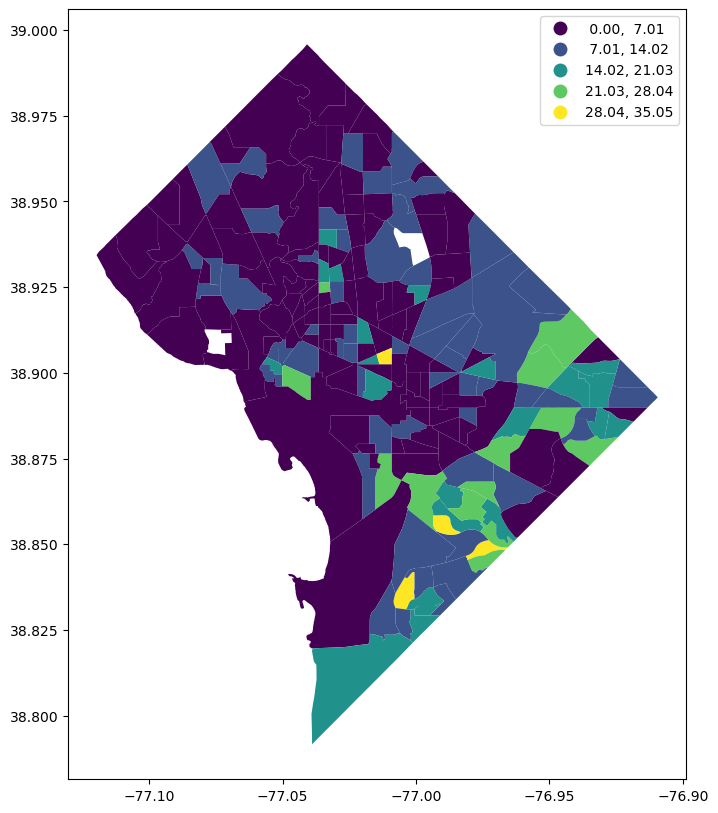

In [146]:
tracts_income.plot(figsize=(12,10),
                 column='PCT_Under $10,000',
                 legend=True, 
                 scheme='equal_interval')

Now, let's overlay our earlier folium map with the census tracts and store location markers

In [149]:
m = folium.Map(location=[38.9072, -77.0369], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

In [150]:
folium.Choropleth(
                  geo_data=tracts_income, 
                  data=tracts_income,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'PCT_Under $10,000'], 
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, 
                  legend_name='Income Under $10,000').add_to(m) 

In [151]:
m

In [154]:
for index, row in healthy_trimmed.iterrows():
    folium.Marker([row.LATITUDE, row.LONGITUDE], popup=row.STORE, tooltip=row.STORE).add_to(m)
m

Now that we have mapped percentage of low-income against healthy corner stores locations we can explore the map further to identify if there are any possible relationship between healthy store location and concentration of low-income families.